In [19]:
map_numtosegment = {-1:'unk',
                    0:'background',
                    1:'mother',
                    2:'daughter',
                    3:'son',
                    4:'cupboard',
                    5:'Cookie Jar',
                    6:'Cookie',
                    7:'Stool',
                    8:'Dish and rag',
                    9:'Sink',
                    10:'Water',
                    11:'Curtain',
                    12:'Outdoors',
                    13:'dishes',
                    14:'countertops'}

In [22]:
import csv
def returndict(filename):


    result_dict = {}
    with open(filename, 'r', newline='') as csv_file:
        csv_reader = csv.reader(csv_file)
        
        # Read the header
        header = next(csv_reader)
        print(f'Header: {header}')

        # Read the rows
        for row in csv_reader:
            key = row[0]
            values = row[1:]
            result_dict[key] = values
    
    return result_dict, header

In [33]:


filename_pc = './tables/secondMost/combined_results.csv'
filename_pd = '../cookieTheftData_2/alig_seg_2mc_table/alig_seg_2mc_combined.csv'


result_dict_pc, header_pc = returndict(filename_pc)
result_dict_pd, header_pd = returndict(filename_pd)

print(result_dict_pc['son'])

Header: ['Word', 'Background', 'Mother', 'Daughter', 'Son', 'Cupboard', 'CookieJar', 'Cookie', 'Stool', 'DishAndRag', 'Sink', 'Water', 'Curtain', 'Outdoors', 'Dishes', 'Countertops', 'Unknown', 'Total']
Header: ['Word', 'Background', 'Mother', 'Daughter', 'Son', 'Cupboard', 'CookieJar', 'Cookie', 'Stool', 'DishAndRag', 'Sink', 'Water', 'Curtain', 'Outdoors', 'Dishes', 'Countertops', 'Unknown', 'Total']
['1', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '2']


In [34]:
header_pc == header_pd

True

In [35]:
header = header_pd

22 ['4', '5', '0', '4', '2', '1', '0', '0', '1', '0', '0', '2', '2', '0', '1', '0', '22'] 22 ['4', '5', '0', '4', '2', '1', '0', '0', '1', '0', '0', '2', '2', '0', '1', '0']
22 [0.18181818181818182, 0.22727272727272727, 0.0, 0.18181818181818182, 0.09090909090909091, 0.045454545454545456, 0.0, 0.0, 0.045454545454545456, 0.0, 0.0, 0.09090909090909091, 0.09090909090909091, 0.0, 0.045454545454545456, 0.0] 16 17
22 ['2', '2', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '6'] 6 ['2', '2', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0']


20 ['5', '1', '0', '0', '1', '0', '0', '0', '3', '2', '1', '1', '4', '1', '1', '0', '20'] 20 ['5', '1', '0', '0', '1', '0', '0', '0', '3', '2', '1', '1', '4', '1', '1', '0']
20 [0.25, 0.05, 0.0, 0.0, 0.05, 0.0, 0.0, 0.0, 0.15, 0.1, 0.05, 0.05, 0.2, 0.05, 0.05, 0.0] 16 17
20 ['5', '0', '0', '1', '3', '0', '0', '0', '0', '0', '2', '0', '1', '1', '0', '0', '13'] 13 ['5', '0', '0', '1', '3', '0', '0', '0', '0', '0', '2', '0', '1', '1', '0', '0']
['Background', 'Mother', 'Daughter', 'Son', 'Cupboard', 'CookieJar', 'Cookie', 'Stool', 'DishAndRag', 'Sink', 'Water', 'Curtain', 'Outdoors', 'Dishes', 'Countertops', 'Unknown'] 16
water


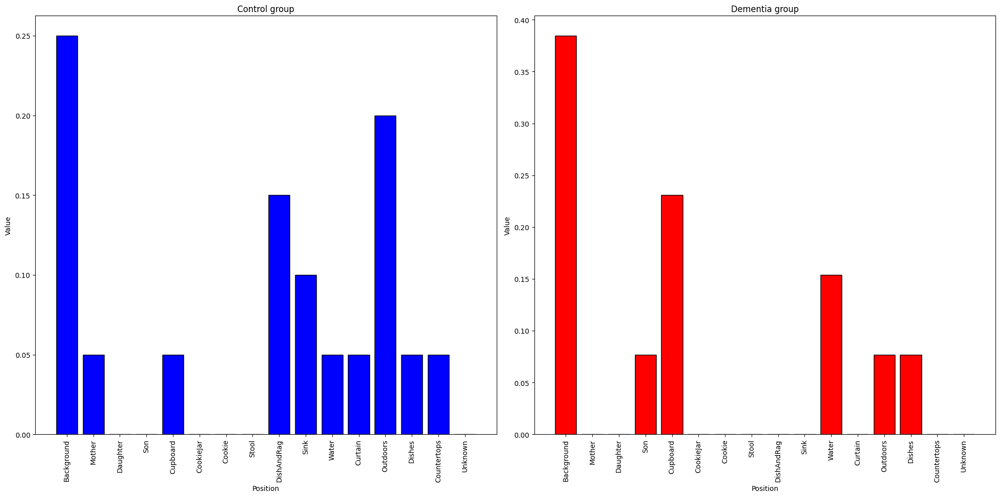

In [56]:
import matplotlib.pyplot as plt
import numpy as np

myword = 'water'

### Control group
total_pc = int(result_dict_pc[myword][-1])
array_pc = result_dict_pc[myword][:-1]
print(total_pc, result_dict_pc[myword], total_pc, array_pc)

pc_histo = [int(x)/total_pc for x in array_pc]
print(total_pc, pc_histo, len(pc_histo), len(result_dict_pc[myword]))

### Dementia group
total_pd = int(result_dict_pd[myword][-1])
array_pd = result_dict_pd[myword][:-1]
print(total_pc, result_dict_pd[myword], total_pd, array_pd)

pd_histo = [int(x)/total_pd for x in array_pd]

# Example array of values
data_array = [1, 2, 3, 4, 5]

# Generate x-axis values (positions)
print(header[1:-1], len(header[1:-1]))
positions = ["Background", "Mother", "Daughter", "Son", "Cupboard", "CookieJar", "Cookie", "Stool", "DishAndRag", "Sink", "Water", "Curtain", "Outdoors", "Dishes", "Countertops","Unknown"]
print(myword)
# Create a figure with a specific size
plt.figure(figsize=(20, 10))

# Plot the first bar chart
plt.subplot(1, 2, 1)
plt.bar(positions, pc_histo, color='blue', edgecolor='black')
plt.title('Control group')
plt.xlabel('Position')
plt.ylabel('Value')
plt.xticks(positions, rotation='vertical')

# Plot the second line chart
plt.subplot(1, 2, 2)
# Plot the bar chart
plt.bar(positions, pd_histo, color='red', edgecolor='black')
plt.title('Dementia group')
plt.xlabel('Position')
plt.ylabel('Value')

# Rotate position labels vertically
plt.xticks(positions, rotation='vertical')


# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [47]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


df = pd.read_csv('output_array_but_better.csv')
loaded_array = df.values
pc_image = loaded_array
pd_image = loaded_array
unique_values = np.unique(loaded_array)
print(unique_values)
# Create a dictionary to store positions of each unique value
positions_dict = {}

# Iterate over unique values and find their positions
for value in unique_values:
    positions = np.where(loaded_array == value)
    positions_dict[value] = list(zip(positions[0], positions[1]))


print(positions_dict)


[-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
{-1: [(462, 913), (462, 914), (462, 915), (463, 912), (463, 916), (464, 912), (464, 917), (465, 912), (468, 912), (468, 934), (468, 935), (469, 921), (469, 936), (470, 931), (471, 922), (472, 916), (472, 917), (472, 928), (473, 908), (473, 911), (473, 927), (474, 906), (474, 915), (474, 916), (477, 905), (478, 905), (478, 932), (479, 906), (479, 917), (479, 924), (479, 932), (480, 909), (480, 913), (480, 919), (480, 925), (480, 955), (480, 956), (480, 958), (481, 923), (481, 933), (481, 953), (481, 965), (482, 934), (482, 967), (483, 918), (483, 935), (483, 950), (483, 970), (484, 949), (484, 971), (485, 917), (485, 923), (485, 946), (485, 948), (485, 973), (486, 917), (486, 934), (486, 945), (487, 877), (487, 884), (487, 945), (487, 1008), (488, 922), (489, 874), (489, 889), (489, 915), (489, 922), (489, 962), (489, 974), (489, 1005), (489, 1010), (490, 873), (490, 893), (490, 914), (490, 944), (490, 978), (490, 1010), (491, 871), (491

In [48]:
len(positions_dict[-1])

1843

In [49]:

myword = 'mother'

### Control group
total_pc = int(result_dict_pc[myword][-1])
array_pc = result_dict_pc[myword][:-1]
print(total_pc, result_dict_pc[myword], total_pc, array_pc)

pc_histo = [int(x)/total_pc for x in array_pc]
print(total_pc, pc_histo, len(pc_histo), len(result_dict_pc[myword]))

### Dementia group
total_pd = int(result_dict_pd[myword][-1])
array_pd = result_dict_pd[myword][:-1]
print(total_pc, result_dict_pd[myword], total_pd, array_pd)

pd_histo = [int(x)/total_pd for x in array_pd]

22 ['4', '5', '0', '4', '2', '1', '0', '0', '1', '0', '0', '2', '2', '0', '1', '0', '22'] 22 ['4', '5', '0', '4', '2', '1', '0', '0', '1', '0', '0', '2', '2', '0', '1', '0']
22 [0.18181818181818182, 0.22727272727272727, 0.0, 0.18181818181818182, 0.09090909090909091, 0.045454545454545456, 0.0, 0.0, 0.045454545454545456, 0.0, 0.0, 0.09090909090909091, 0.09090909090909091, 0.0, 0.045454545454545456, 0.0] 16 17
22 ['2', '2', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '6'] 6 ['2', '2', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0']


In [54]:
#pc_array = loaded_array
#pd_array = loaded_array

for i in range(0, 14):
    positions_temp = positions_dict[i][0]
    print(positions_temp)
    #exit(0)
    #pc_image[positions_temp] = pc_histo[i]*255
    #pd_image[positions_temp] = pd_histo[i]*255

(0, 0)
(97, 783)
(310, 248)
(78, 306)
(8, 91)
(70, 291)
(34, 796)
(551, 351)
(96, 786)
(463, 913)
(562, 889)
(35, 795)
(71, 1055)
(70, 1055)


In [55]:
np.unique(pc_array)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

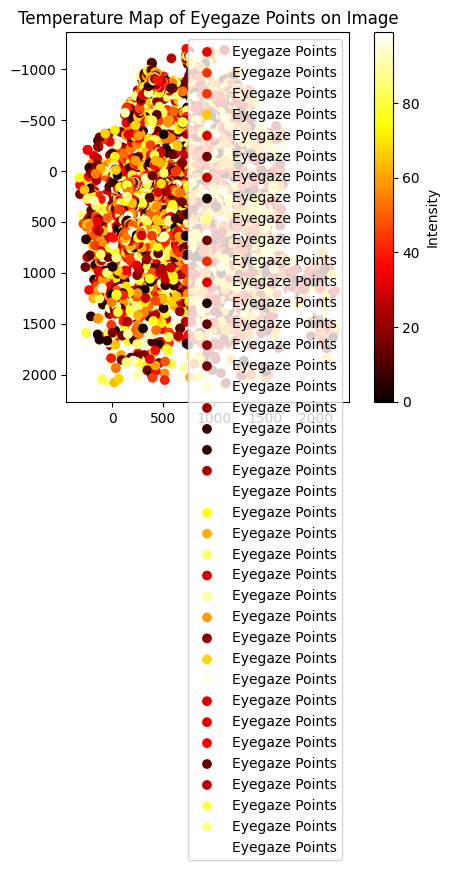

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

# Directory path
directory = './eyegaze_aligned'

# List to store file paths
file_paths = []

# Iterate through the directory
for filename in os.listdir(directory):
    if os.path.isfile(os.path.join(directory, filename)):
        file_paths.append(os.path.join(directory, filename))

# Read PNG image
image_path = 'cookie.png'  # Replace 'path_to_your_image.png' with the actual path to your PNG image
image = Image.open(image_path)

# Plot PNG image
fig, ax = plt.subplots()
ax.imshow(image)

for file_path in file_paths:
    # Read CSV file into DataFrame, skipping the first two columns and handling "nan" values
    df = pd.read_csv(file_path, usecols=lambda x: x not in ['Time', 'Timestamp'], na_values=['nan'],encoding='latin1')
    
    # Extract X and Y coordinates
    if 'X' in df.columns and 'Y' in df.columns:  # Check if 'X' and 'Y' columns exist
        x_coords = df['X'].values * image.width
        y_coords = df['Y'].values * image.height
        
        # Calculate intensity (for example, using the number of eyegaze points)
        intensity = np.random.randint(0, 100, size=len(x_coords))  # Example intensity values (replace with actual data)
        
        # Plot eyegaze points with colors representing intensity
        sc = ax.scatter(x_coords, y_coords, c=intensity, cmap='hot', marker='o', label='Eyegaze Points')

# Add colorbar
cbar = plt.colorbar(sc)
cbar.set_label('Intensity')

# Set plot title and legend
ax.set_title('Temperature Map of Eyegaze Points on Image')
ax.legend()

# Show plot
plt.show()